In [62]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance

In [2]:
df = pd.read_csv("../artifacts/raw/data.csv")

C:\Users\sumit\AppData\Local\Temp\ipykernel_19468\618008779.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../artifacts/raw/data.csv")


In [3]:
df.head()

,age,gender,marital_status,education,monthly_salary,employment_type,years_of_employment,company_type,house_type,monthly_rent,...,existing_loans,current_emi_amount,credit_score,bank_balance,emergency_fund,emi_scenario,requested_amount,requested_tenure,emi_eligibility,max_monthly_emi
0,38.0,Female,Married,Professional,82600.0,Private,0.9,Mid-size,Rented,20000.0,...,Yes,23700.0,660.0,303200.0,70200.0,Personal Loan EMI,850000.0,15,Not_Eligible,500.0
1,38.0,Female,Married,Graduate,21500.0,Private,7.0,MNC,Family,0.0,...,Yes,4100.0,714.0,92500.0,26900.0,E-commerce Shopping EMI,128000.0,19,Not_Eligible,700.0
2,38.0,Male,Married,Professional,86100.0,Private,5.8,Startup,Own,0.0,...,No,0.0,650.0,672100.0,324200.0,Education EMI,306000.0,16,Eligible,27775.0
3,58.0,Female,Married,High School,66800.0,Private,2.2,Mid-size,Own,0.0,...,No,0.0,685.0,440900.0,178100.0,Vehicle EMI,304000.0,83,Eligible,16170.0
4,48.0,Female,Married,Professional,57300.0,Private,3.4,Mid-size,Family,0.0,...,No,0.0,770.0,97300.0,28200.0,Home Appliances EMI,252000.0,7,Not_Eligible,500.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404800 entries, 0 to 404799
Data columns (total 27 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   age                     404800 non-null  object 
 1   gender                  404800 non-null  object 
 2   marital_status          404800 non-null  object 
 3   education               402396 non-null  object 
 4   monthly_salary          404800 non-null  object 
 5   employment_type         404800 non-null  object 
 6   years_of_employment     404800 non-null  float64
 7   company_type            404800 non-null  object 
 8   house_type              404800 non-null  object 
 9   monthly_rent            402374 non-null  float64
 10  family_size             404800 non-null  int64  
 11  dependents              404800 non-null  int64  
 12  school_fees             404800 non-null  float64
 13  college_fees            404800 non-null  float64
 14  travel_expenses     

In [5]:
df.isna().sum().sort_values(ascending = False)

monthly_rent              2426
bank_balance              2426
credit_score              2420
education                 2404
emergency_fund            2351
marital_status               0
monthly_salary               0
years_of_employment          0
gender                       0
employment_type              0
age                          0
family_size                  0
house_type                   0
company_type                 0
dependents                   0
groceries_utilities          0
school_fees                  0
college_fees                 0
travel_expenses              0
current_emi_amount           0
existing_loans               0
other_monthly_expenses       0
emi_scenario                 0
requested_amount             0
requested_tenure             0
emi_eligibility              0
max_monthly_emi              0
dtype: int64

In [6]:
df.duplicated().sum()

np.int64(0)

### Dropping Null values

In [7]:
df.dropna(inplace = True)

In [8]:
df.isna().sum().sort_values(ascending = False)

age                       0
gender                    0
marital_status            0
education                 0
monthly_salary            0
employment_type           0
years_of_employment       0
company_type              0
house_type                0
monthly_rent              0
family_size               0
dependents                0
school_fees               0
college_fees              0
travel_expenses           0
groceries_utilities       0
other_monthly_expenses    0
existing_loans            0
current_emi_amount        0
credit_score              0
bank_balance              0
emergency_fund            0
emi_scenario              0
requested_amount          0
requested_tenure          0
emi_eligibility           0
max_monthly_emi           0
dtype: int64

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
years_of_employment,392920.0,5.368702,6.084106,0.5,1.2,3.20,7.2,36.0
monthly_rent,392920.0,5827.237618,8646.175758,0.0,0.0,0.00,10600.0,80000.0
family_size,392920.0,2.940713,1.075015,1.0,2.0,3.00,4.0,5.0
dependents,392920.0,1.940713,1.075015,0.0,1.0,2.00,3.0,4.0
school_fees,392920.0,4625.445383,5061.137604,0.0,0.0,3100.00,9000.0,15000.0
college_fees,392920.0,4066.824290,7320.156014,0.0,0.0,0.00,6500.0,25000.0
travel_expenses,392920.0,5687.125878,3392.840781,600.0,3200.0,4900.00,7400.0,30300.0
groceries_utilities,392920.0,12805.927670,6993.317590,1800.0,7700.0,11400.00,16400.0,71200.0
other_monthly_expenses,392920.0,7120.370050,4511.001689,600.0,3800.0,6000.00,9300.0,42900.0
current_emi_amount,392920.0,4541.903186,7034.490476,0.0,0.0,0.00,8000.0,56300.0


## TARGET DISTRIBUTION

In [10]:
df["emi_eligibility"].value_counts(normalize=True)

emi_eligibility
Not_Eligible    0.772951
Eligible        0.183875
High_Risk       0.043174
Name: proportion, dtype: float64

In [11]:
df["max_monthly_emi"].describe()

count    392920.000000
mean       6766.009512
std        7746.720160
min         500.000000
25%         500.000000
50%        4217.450000
75%        9792.000000
max       91040.400000
Name: max_monthly_emi, dtype: float64

### Data is highly imbalanced 

In [12]:
categorical_cols = [
    "gender", "marital_status", "education", "employment_type", 
    "company_type", "house_type", "existing_loans", 
    "emi_scenario", "emi_eligibility"
]
numerical_cols = [
    "age", "monthly_salary", "years_of_employment", "monthly_rent", 
    "family_size", "dependents", "school_fees", "college_fees", 
    "travel_expenses", "groceries_utilities", "other_monthly_expenses", 
    "current_emi_amount", "credit_score", "bank_balance", 
    "emergency_fund", "requested_amount", "requested_tenure", 
    "max_monthly_emi"
]

In [13]:
for col in df.columns:
    if col in categorical_cols:
        df[col] = df[col].astype('category')
    elif col in numerical_cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')

In [14]:
numerical_cols, categorical_cols

(['age',
  'monthly_salary',
  'years_of_employment',
  'monthly_rent',
  'family_size',
  'dependents',
  'school_fees',
  'college_fees',
  'travel_expenses',
  'groceries_utilities',
  'other_monthly_expenses',
  'current_emi_amount',
  'credit_score',
  'bank_balance',
  'emergency_fund',
  'requested_amount',
  'requested_tenure',
  'max_monthly_emi'],
 ['gender',
  'marital_status',
  'education',
  'employment_type',
  'company_type',
  'house_type',
  'existing_loans',
  'emi_scenario',
  'emi_eligibility'])

### Handel Outliers

In [15]:
def cap_outliers(df, cols, lower=0.01, upper=0.99):
    for col in cols:
        low = df[col].quantile(lower)
        high = df[col].quantile(upper)
        df[col] = df[col].clip(low, high)
    return df

df = cap_outliers(df, numerical_cols)

# FEATURE ENGINEERING

### Total Monthly Expenses

In [16]:
df["total_monthly_expenses"] = (
    df["monthly_rent"] +
    df["school_fees"] +
    df["college_fees"] +
    df["travel_expenses"] +
    df["groceries_utilities"] +
    df["other_monthly_expenses"] +
    df["current_emi_amount"]
)

### Disposable Income

In [17]:
df["disposable_income"] = df["monthly_salary"] - df["total_monthly_expenses"]

### EMI Burden Ratio

In [18]:
df["emi_burden_ratio"] = df["current_emi_amount"] / (df["monthly_salary"] + 1)

### Expense-to-Income Ratio

In [19]:
df["expense_income_ratio"] = df["total_monthly_expenses"] / (df["monthly_salary"] + 1)

### Emergency Fund Strength

In [20]:
df["emergency_fund_ratio"] = (
    df["emergency_fund"] / (df["total_monthly_expenses"] + 1)
)

### Savings Buffer

In [21]:
df["savings_ratio"] = df["bank_balance"] / (df["monthly_salary"] * 6 + 1)

### Employment Stability Score

In [22]:
df['years_of_employment'].dtype

dtype('float64')

In [23]:
employment_weight = {
    "Government": 1.2,
    "Private": 1.0,
    "Self-employed": 0.8
}

df["employment_weight"] = df["employment_type"].map(employment_weight).astype(float)
df["employment_stability_score"] = (
    df["years_of_employment"] * df["employment_weight"]
)

### DROP TEMP / LEAKAGE-PRONE COLUMNS

In [24]:
df.drop(columns=["employment_weight"], inplace=True)

## Checking categorical columns

In [25]:
df['emi_eligibility'].value_counts()

emi_eligibility
Not_Eligible    303708
Eligible         72248
High_Risk        16964
Name: count, dtype: int64

In [26]:
df['existing_loans'].value_counts()

existing_loans
No     236130
Yes    156790
Name: count, dtype: int64

## DEFINE TARGETS & FEATURES (NO LEAKAGE)

In [27]:
X = df.drop(columns=["emi_eligibility", "max_monthly_emi"])
y_classification = df["emi_eligibility"]
y_regression = df["max_monthly_emi"]

## HANDLE TARGET IMBALANCE

### Encode classification target

In [28]:
label_encoder = LabelEncoder()
y_class_encoded = label_encoder.fit_transform(y_classification)

label_mapping = dict(zip(
    label_encoder.classes_,
    label_encoder.transform(label_encoder.classes_)
))

In [29]:
label_mapping

{'Eligible': np.int64(0),
 'High_Risk': np.int64(1),
 'Not_Eligible': np.int64(2)}

### Compute class weights

In [30]:
class_weights_array = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(y_class_encoded),
    y=y_class_encoded
)

class_weights = dict(zip(
    np.unique(y_class_encoded),
    class_weights_array
))

In [31]:
class_weights

{np.int64(0): np.float64(1.8128298822574096),
 np.int64(1): np.float64(7.720663365558438),
 np.int64(2): np.float64(0.4312475579613752)}

### Create sample weights

In [32]:
sample_weights = pd.Series(y_class_encoded).map(class_weights)

## ENCODE BINARY FEATURE (existing_loans)

In [33]:
X["existing_loans"] = X["existing_loans"].map({"Yes": 1, "No": 0})

## DEFINE FEATURE GROUPS

In [34]:
categorical_features = [
    "gender",
    "marital_status",
    "education",
    "employment_type",
    "company_type",
    "house_type",
    "emi_scenario"
]

numerical_features = [
    col for col in X.columns if col not in categorical_features
]


## BUILD PREPROCESSING PIPELINE (ENCODING + SCALING)

In [37]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numerical_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features)
    ]
)

## APPLY PREPROCESSING (MODEL-READY DATA)

In [38]:
X_processed = preprocessor.fit_transform(X)

### Retrieve feature names

In [44]:
cat_feature_names = preprocessor.named_transformers_["cat"] \
    .get_feature_names_out(categorical_features)

feature_names = numerical_features + list(cat_feature_names)

X_processed = pd.DataFrame(X_processed, columns=feature_names)

### Split Data

In [45]:
X_train, X_test, y_train, y_test, sw_train, sw_test = train_test_split(
    X_processed,
    y_class_encoded,
    sample_weights,
    test_size=0.2,
    random_state=42,
    stratify=y_class_encoded
)

# EDA GRAPHS

## 📊 Graph 1: EMI Eligibility Distribution

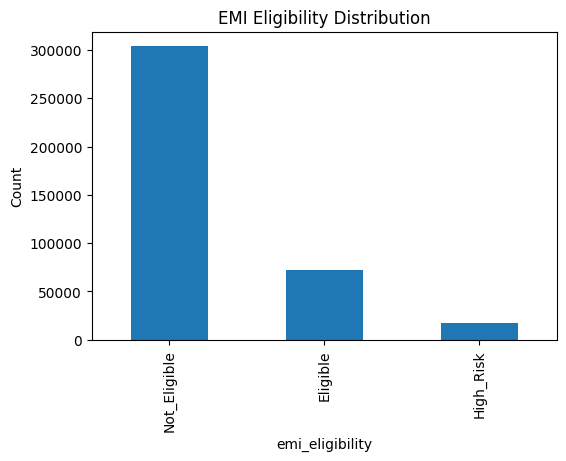

In [49]:
df["emi_eligibility"].value_counts().plot(
    kind="bar",
    title="EMI Eligibility Distribution",
    figsize=(6,4)
)
plt.ylabel("Count")
plt.show()

## 📊 Graph 2: Credit Score vs Eligibility

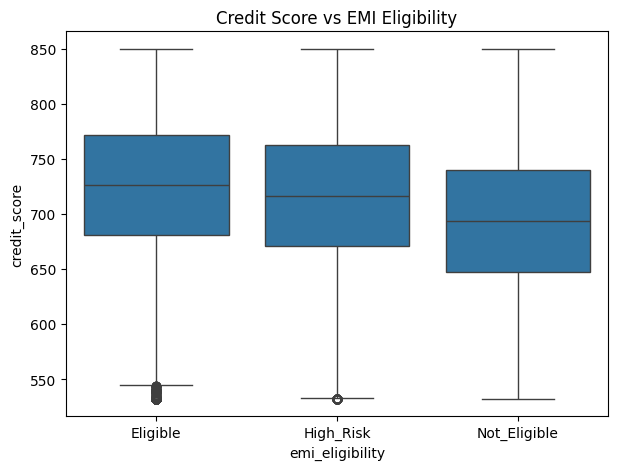

In [53]:
plt.figure(figsize=(7,5))
sns.boxplot(
    data=df,
    x="emi_eligibility",
    y="credit_score"
)
plt.title("Credit Score vs EMI Eligibility")
plt.show()


## 📊 Graph 3: Income vs Expenses (Stress Line)

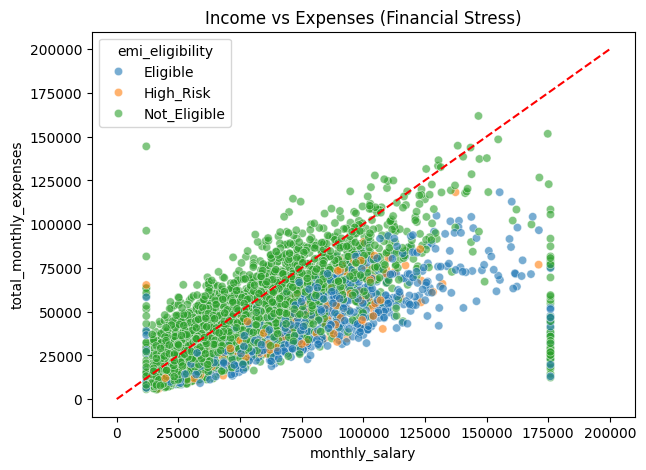

In [54]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=df.sample(5000),
    x="monthly_salary",
    y="total_monthly_expenses",
    hue="emi_eligibility",
    alpha=0.6
)

plt.plot([0, 200000], [0, 200000], "--r")
plt.title("Income vs Expenses (Financial Stress)")
plt.show()


## 📊 Graph 4: EMI Burden Ratio vs Eligibility

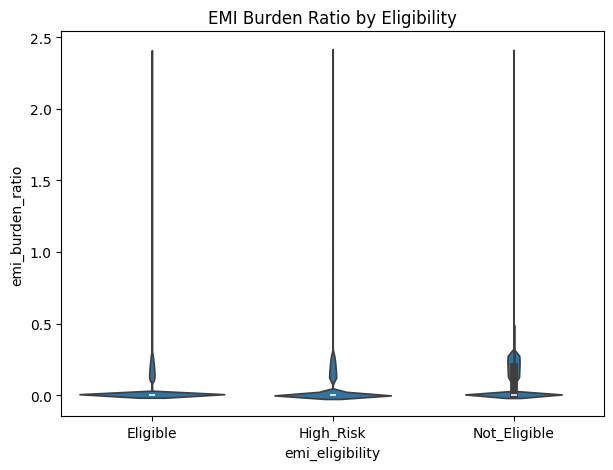

In [55]:
plt.figure(figsize=(7,5))
sns.violinplot(
    data=df,
    x="emi_eligibility",
    y="emi_burden_ratio"
)
plt.title("EMI Burden Ratio by Eligibility")
plt.show()


## 📊 Graph 5: Max EMI vs Salary (Regression Sanity)

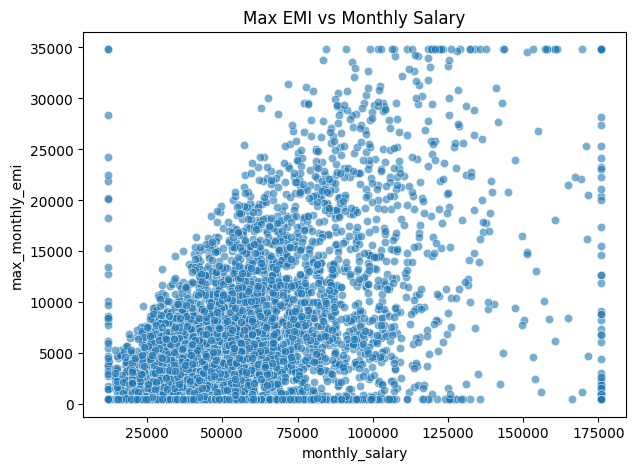

In [56]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=df.sample(5000),
    x="monthly_salary",
    y="max_monthly_emi",
    alpha=0.6
)
plt.title("Max EMI vs Monthly Salary")
plt.show()


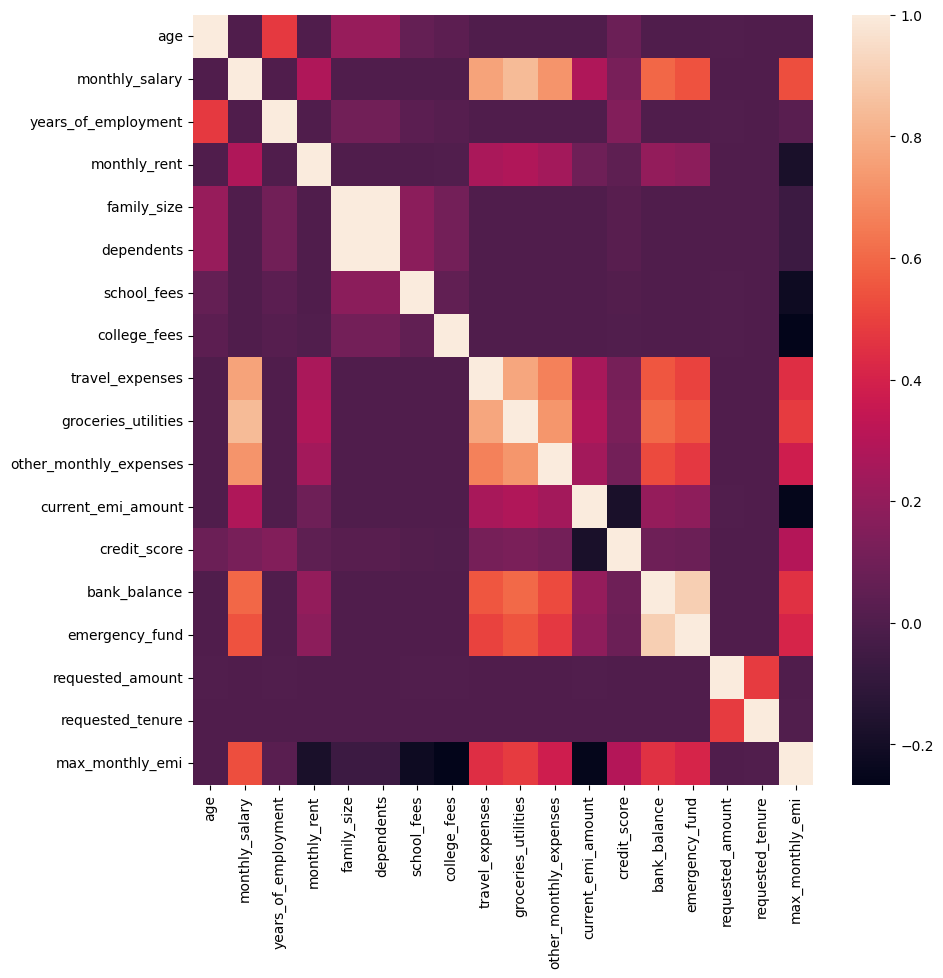

In [61]:
plt.figure(figsize = (10, 10))
sns.heatmap(df[numerical_cols].corr(), annot = False)
plt.show()

c:\Users\sumit\OneDrive\Desktop\EMIPredict AI - Intelligent Financial Risk Assessment Platform\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\sumit\OneDrive\Desktop\EMIPredict AI - Intelligent Financial Risk Assessment Platform\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\sumit\OneDrive\Desktop\EMIPredict AI - Intelligent Financial Risk Assessment Platform\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\sumit\OneDrive\Desktop\EMIPredict AI - Intelligent Financial Risk Assessment Platform\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector,

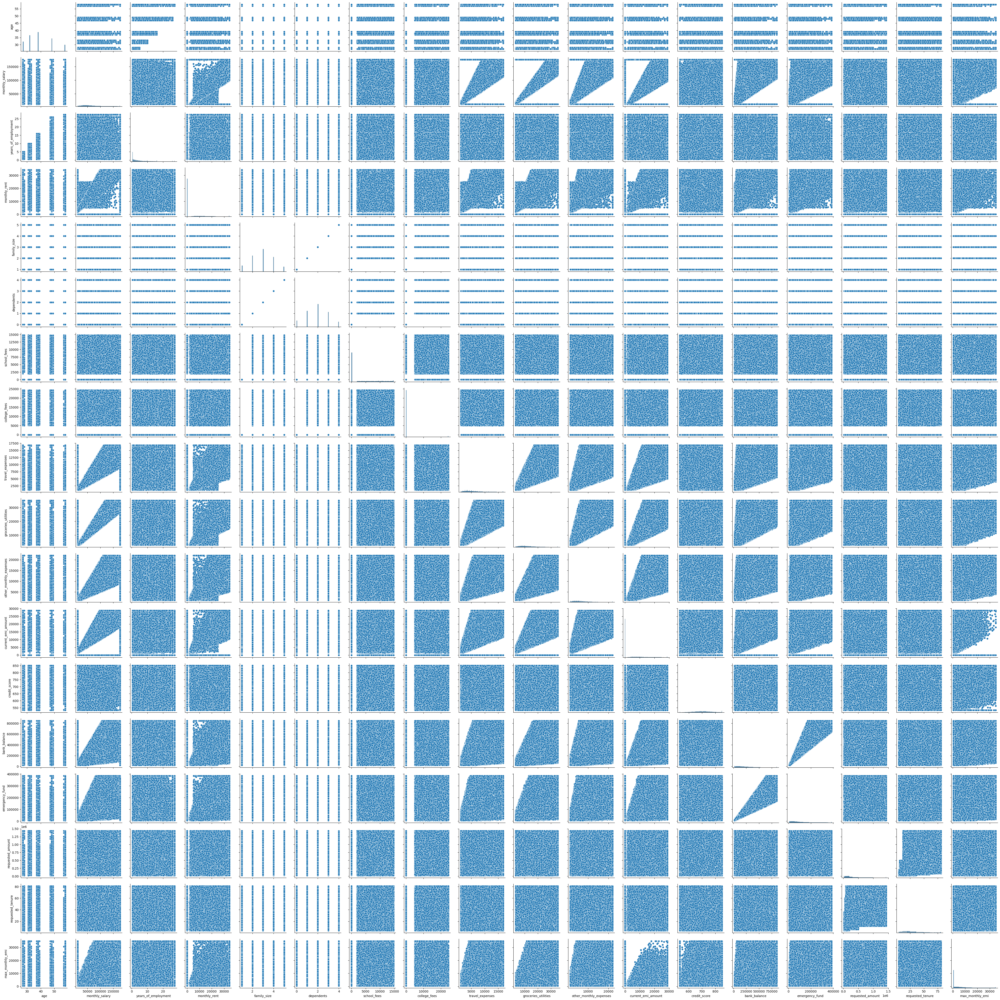

In [60]:
sns.pairplot(df[numerical_cols], kind = 'scatter', diag_kind = 'hist', palette = 'Rainbow')
plt.show()

# MODEL TESTING

## FEATURE IMPORTANCE

### Permutation Importance

In [ ]:
# result = permutation_importance(clf, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = -1)

In [ ]:
# importance_df = pd.DataFrame({
#     "Feature" : features,
#     "Importance" : result.importances_mean
# })

In [ ]:
# importance_df.sort_values(by='Importance', ascending=False)